# 17. 난 스케치를 할 테니 너는 채색을 하거라

**이미지 생성 모델로 사용되는 GAN 중에서 조건이 추가된 cGAN에 대해 알아보고 Pix2Pix를 배워봅니다.**

## 17-13. 프로젝트 : Segmentation map으로 도로 이미지 만들기

---

## 목차

1. 데이터에 한 가지 이상의 **augmentation 방법을 적용** 하여 학습해 주세요. (어떠한 방법을 사용했는지 적어주세요.)
2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 **U-Net Generator를 사용** 해 주세요.
3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운로드했던 "val" 폴더 내 이미지를 사용해 주세요.
4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 **스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화** 해 주세요.
5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 **중간 손실 값에 대한 로그** 를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

---

- 라이브러리 불러오기

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import tensorflow_datasets as tfds
import tensorflow as tf
from tensorflow.keras import layers, Input, Model
from tensorflow.keras import optimizers, losses
from tensorflow import data
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import time
import imageio
# import PIL
from IPython import display

- 데이터 불러오기

In [3]:
data_dir = 'drive/MyDrive/Colab Notebooks/AIFFEL/EXPLORATION/Node_17'

In [4]:
train_path = os.path.join(data_dir, 'cityscapes/train/')
test_path = os.path.join(data_dir, 'cityscapes/val/')
print("number of train examples :", len(os.listdir(train_path)))  # 1000
print("number of test examples :", len(os.listdir(test_path)))  # 5

number of train examples : 1000
number of test examples : 5


- 학습용 데이터셋에서 임의로 6장 선택하여 시각화

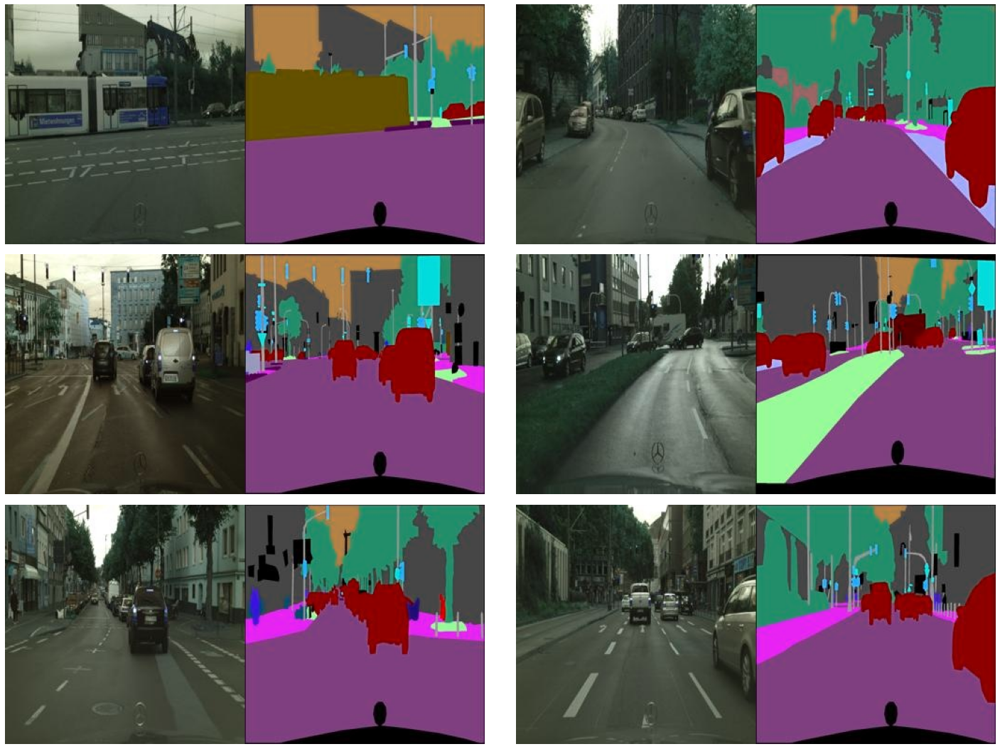

In [5]:
plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_path + os.listdir(train_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.tight_layout()
    plt.axis('off')
    plt.imshow(img)

- 이미지 크기 확인

In [6]:
f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)  # (256, 512, 3)

(256, 512, 3)


- 이미지 나누기
  - input_image
  - real_image

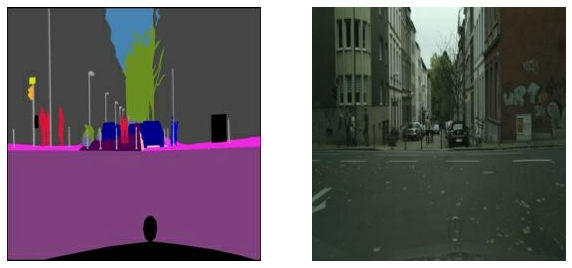

In [7]:
def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    real_image = img[:, :w, :] 
    real_image = tf.cast(real_image, tf.float32)
    input_image = img[:, w:, :] 
    input_image = tf.cast(input_image, tf.float32)
    return normalize(input_image), normalize(real_image)

f = train_path + os.listdir(train_path)[1]
input_image, real_image = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(denormalize(input_image))
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(denormalize(real_image))

- augmentation 적용

In [8]:
@tf.function() #빠른 텐서플로 연산을 위해 @tf.function()을 사용.
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]

- augmentation 적용 후 시각화

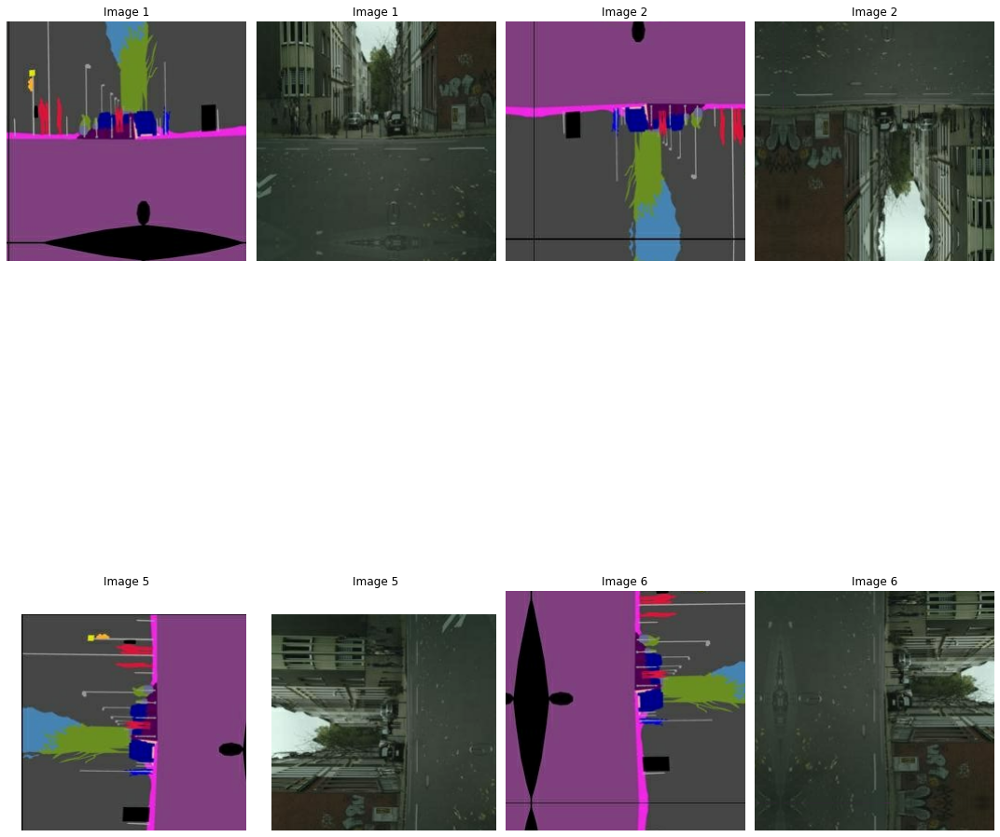

In [9]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_input, augmented_real = apply_augmentation(input_image, real_image)
    
    plt.subplot(3,4,i)
    plt.axis('off'); plt.imshow(denormalize(augmented_input)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1) 
    plt.axis('off'); plt.imshow(denormalize(augmented_real)); plt.title(f"Image {img_n}")
    plt.tight_layout()
    img_n += 1

- augmentation 적용 후 이미지 1개 시각화

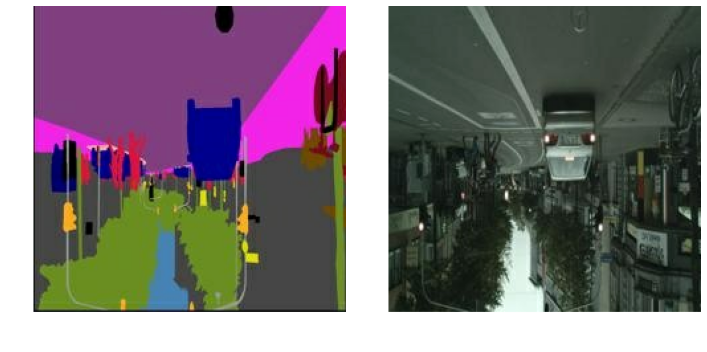

In [10]:
def get_train(img_path):
    input_image, real_image = load_img(img_path)
    input_image, real_image = apply_augmentation(input_image, real_image)
    return input_image, real_image

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
input_image, real_image = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(input_image[0].astype(np.uint8))
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(real_image[0].astype(np.uint8))
plt.tight_layout()

- EncodeBlock, DecodeBlock 구현

In [11]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


- U-Net Generator 구현

In [12]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [13]:
generator = UNetGenerator()
generator.get_summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block (EncodeBlock)     (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_1 (EncodeBlock)   (None, 64, 64, 128)  131584      ['encode_block[0][0]']           
                                                                                              

- DiscBlock 구현

In [14]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


- Discriminator 구현

In [15]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


In [16]:
discriminator = Discriminator()
discriminator.get_summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_7 (Concatenate)    (None, 256, 256, 6)  0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']          

- 손실 함수 사용

In [17]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


- optimizer 설정

In [18]:
gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


- 1개 배치 데이터 입력했을 때 가중치 1회 업데이트

In [19]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


- 생성 이미지 저장

In [20]:
def generate_and_save_images(model, epoch, it, save_file_num=1):

    plt.figure(figsize=(15,15))
    for train_idx in range(len(os.listdir(train_path))//10):
        f = train_path + os.listdir(train_path)[train_idx]
        input_image, real_image = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0))
        pred = denormalize(pred)

        plt.subplot(10, 10, train_idx+1)  # 100개 sample 이라서 10행 10열로 시각화
        plt.imshow(pred[0])
        plt.axis('off')

    plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)

    save_file_path = os.path.join(data_dir, 'cityscapes/generated_samples/sample_{}'.format(save_file_num))
    if not os.path.exists(save_file_path):
        os.makedirs(save_file_path)
    
    save_file_path = os.path.join(save_file_path, 'sample_epoch_{:04d}_iter_{:03d}.png'.format(epoch, it))
    plt.savefig(save_file_path)  # 이미지 저장

    plt.show()

- history 그리기

In [21]:
def draw_train_history(history, epoch, save_file_num=1):
    plt.figure(figsize=(15,15))

    plt.subplot(411)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')

    plt.subplot(412)  
    plt.plot(history['gen_loss'], 'tab:blue')   
    plt.title('gen_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss'], loc='upper left')

    plt.subplot(413)  
    plt.plot(history['l1_loss'], 'tab:green')   
    plt.title('l1_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['l1_loss'], loc='upper left')  

    plt.subplot(414)  
    plt.plot(history['disc_loss'], 'tab:orange')   
    plt.title('disc_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['disc_loss'], loc='upper left')  

    plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)

    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    save_file_path = os.path.join(data_dir, 'cityscapes/training_history/training_history_{}'.format(save_file_num))
    if not os.path.exists(save_file_path):
        os.makedirs(save_file_path)
    
    save_file_path = os.path.join(save_file_path, 'training_history_{:04d}.png'.format(epoch))
    plt.savefig(save_file_path)  # 이미지 저장

    plt.show()

- 체크포인트 설정

In [22]:
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                 discriminator_optimizer=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

- 학습 진행

In [23]:
def train(dataset, epochs, save_every, save_file_num=1):
    start = time.time()
    history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}
    for epoch in range(1, epochs+1):
        epoch_start = time.time()
        for i, (input_image, ground_truth) in enumerate(train_images):
            g_loss, l1_loss, d_loss = train_step(input_image, ground_truth)
            history['gen_loss'].append(g_loss)
            history['l1_loss'].append(l1_loss)
            history['disc_loss'].append(d_loss)
                    
            # 200회 반복마다 손실을 출력합니다.
            if (i+1) % 200 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, i+1, save_file_num)
                print(f"EPOCH[{epoch+1}] - STEP[{i+1}] \
                        \nTime for epoch {epoch} : {int(time.time()-epoch_start)} sec \
                        \nGenerator_loss:{g_loss.numpy():.4f} \
                        \nL1_loss:{l1_loss.numpy():.4f} \
                        \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")
                
        if (epoch + 1) % save_every == 0:
            checkpoint_dir = os.path.join(data_dir, 'cityscapes/training_checkpoints/training_checkpoints_{}'.format(save_file_num))
            checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, i, save_file_num)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch, save_file_num)

In [24]:
save_every = 5  # 모델 저장 간격
EPOCHS = 100  # 학습 횟수
save_file_num = 1

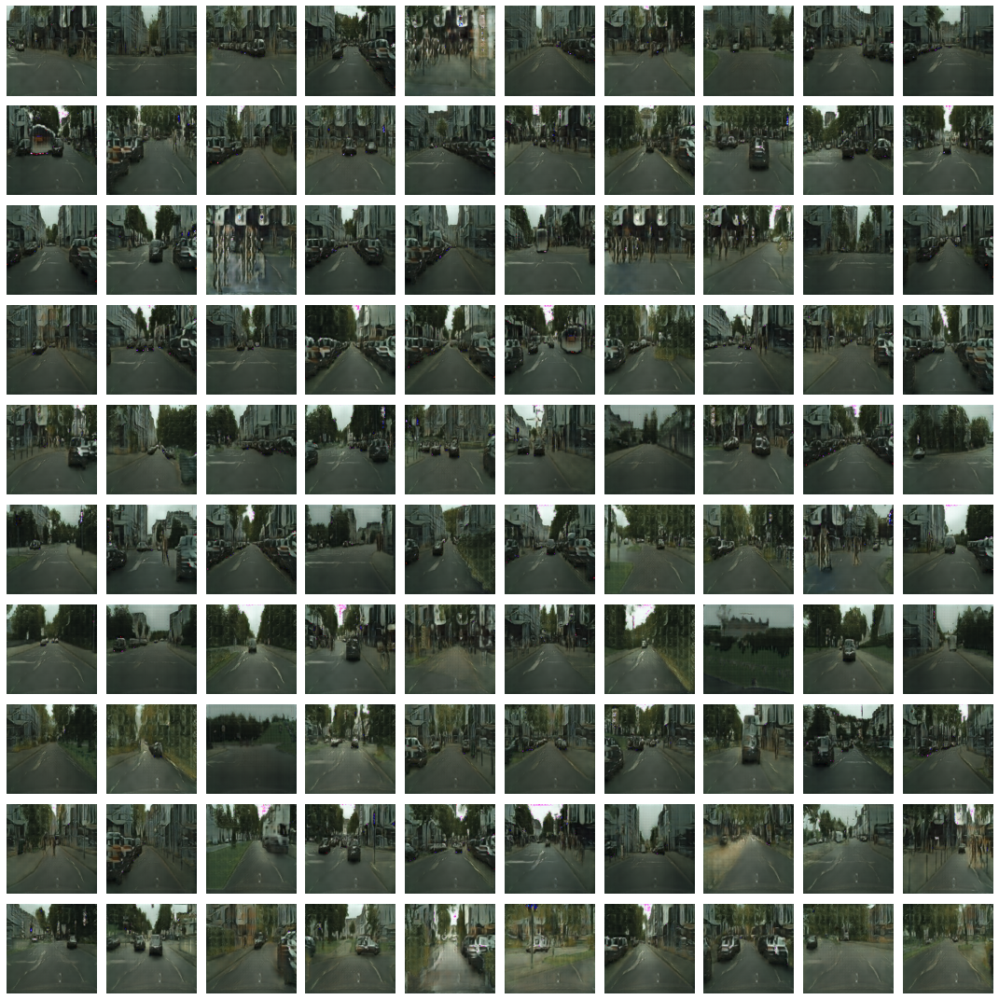

Time for training : 5360 sec


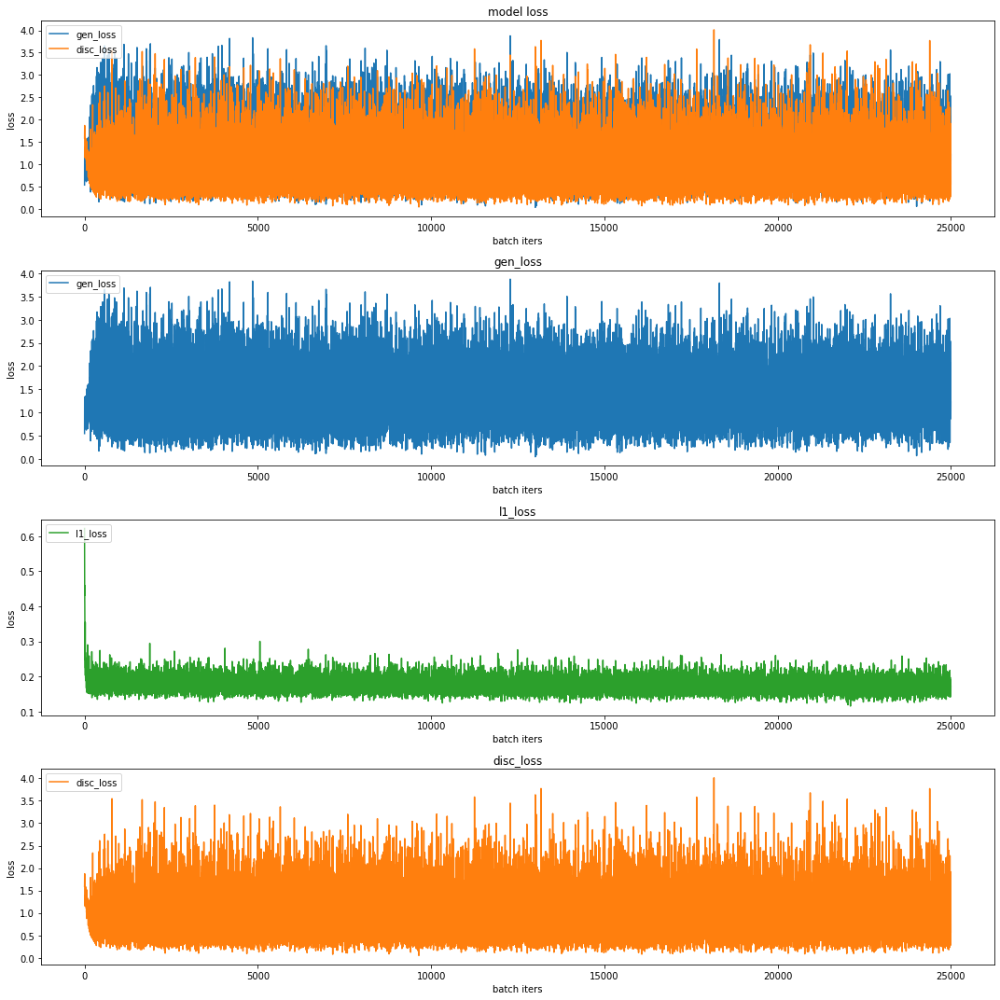

CPU times: user 1h 26min 19s, sys: 4min 55s, total: 1h 31min 15s
Wall time: 1h 29min 25s


In [25]:
%%time
train(train_images, EPOCHS, save_every, save_file_num)

- gif 생성

In [26]:
def make_a_gif(anim_file_num=1, flag=True):
    if flag:
        anim_file = 'drive/MyDrive/Colab Notebooks/AIFFEL/EXPLORATION/Node_17/cityscapes/gif/Pix2Pix_{}.gif'.format(anim_file_num)
        filenames = glob.glob('drive/MyDrive/Colab Notebooks/AIFFEL/EXPLORATION/Node_17/cityscapes/generated_samples/sample_{}/sample*.png'.format(anim_file_num))  # Fake Images
    else:
        anim_file = 'drive/MyDrive/Colab Notebooks/AIFFEL/EXPLORATION/Node_17/cityscapes/gif/Pix2Pix_history_{}.gif'.format(anim_file_num)
        filenames = glob.glob('drive/MyDrive/Colab Notebooks/AIFFEL/EXPLORATION/Node_17/cityscapes/training_history/training_history_{}/training_history*.png'.format(anim_file_num))  # Graphs

    with imageio.get_writer(anim_file, mode='I') as writer:
        filenames = sorted(filenames)
        last = -1
        for i, filename in enumerate(filenames):
            frame = 2*(i**0.5)
            if round(frame) > round(last):
                last = frame
            else:
                continue
            image = imageio.imread(filename)
            writer.append_data(image)
        image = imageio.imread(filename)
        writer.append_data(image)

In [27]:
# Fake Images to GIF
make_a_gif(1, True)

In [28]:
# History Graphs to GIF
make_a_gif(1, False)

- 체크포인트 불러와서 결과 확인

In [29]:
def draw_training_checkpoints_image(save_file_num=1):
    checkpoint_dir = os.path.join(data_dir, 'cityscapes/training_checkpoints/training_checkpoints_{}'.format(save_file_num))
    latest = tf.train.latest_checkpoint(checkpoint_dir)
    checkpoint.restore(latest)

    generator = checkpoint.generator
    discriminator = checkpoint.discriminator

    # 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
    for test_idx in range(len(os.listdir(test_path))):
        f = test_path + os.listdir(test_path)[test_idx]
        input_image, real_image = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0))
        pred = denormalize(pred)

        plt.figure(figsize=(20,10))
        
        plt.subplot(1,3,1); plt.axis('off'); plt.imshow(denormalize(input_image)); plt.title('Input Image')
        plt.subplot(1,3,2); plt.axis('off'); plt.imshow(pred[0]); plt.title('Predicted Image', fontsize=20)
        plt.subplot(1,3,3); plt.axis('off'); plt.imshow(denormalize(real_image)); plt.title('Ground Truth')

        plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)
        plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 cityscapes 이미지가 그려질 것입니다.

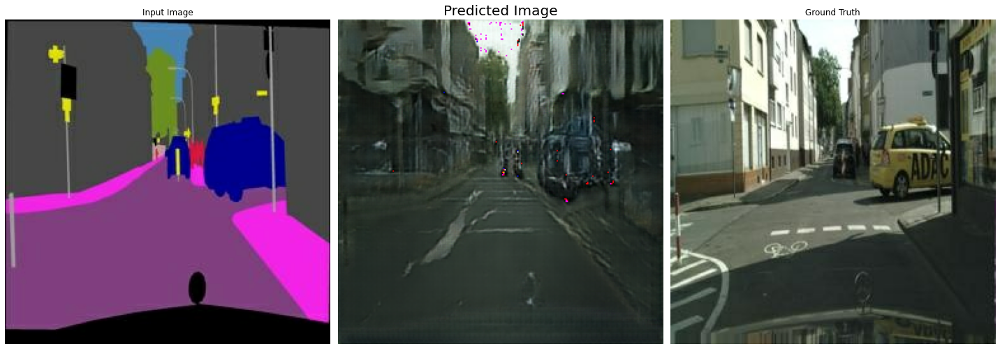

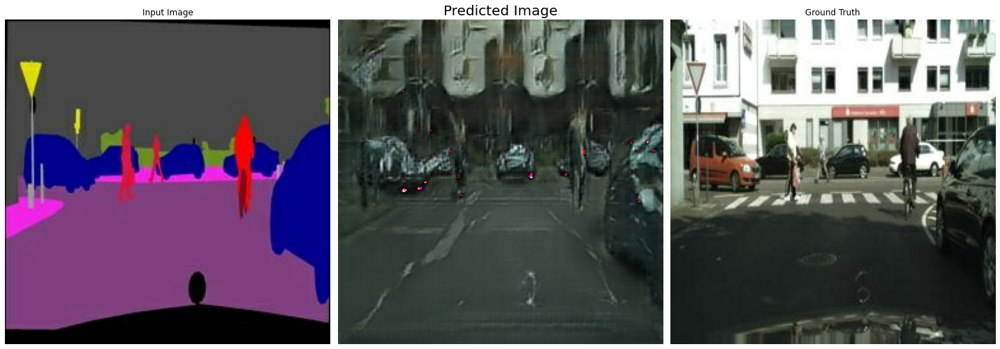

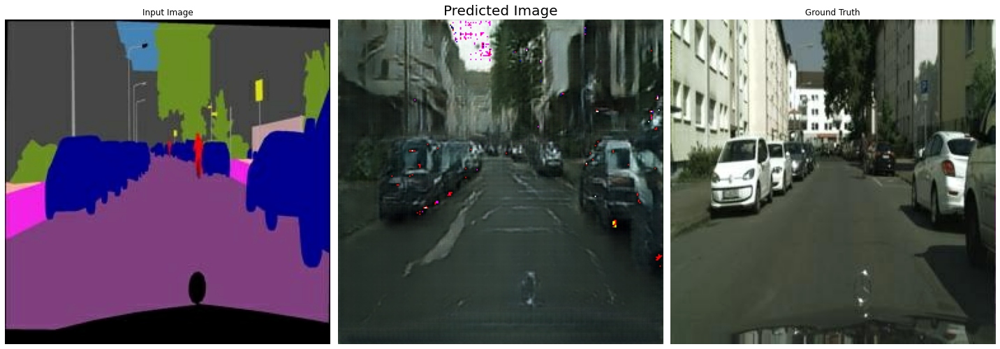

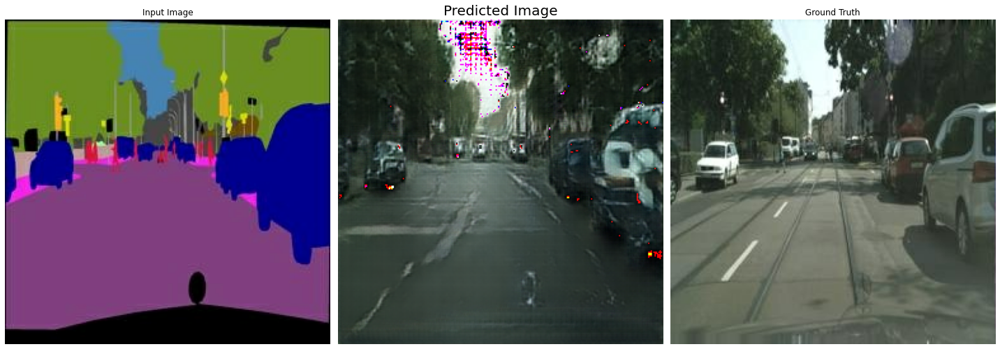

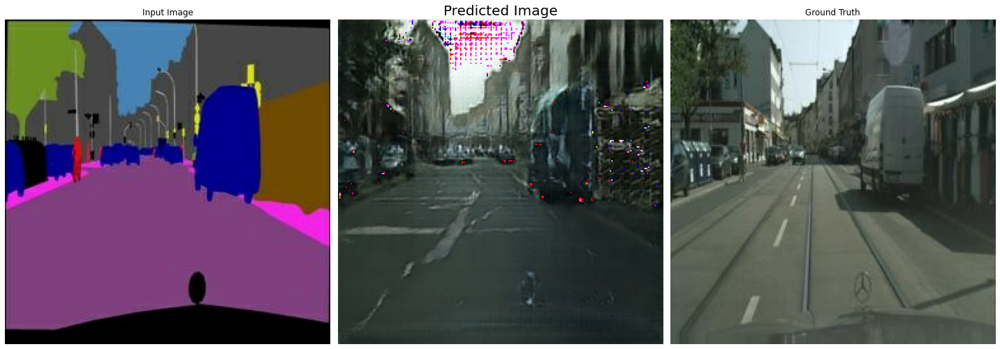

In [30]:
draw_training_checkpoints_image(1)

- 결과 확인

In [31]:
def generate_and_save_images(model, epoch, it, save_file_num=1):

    plt.figure(figsize=(10,5))
    for test_idx in range(len(os.listdir(test_path))):
        f = test_path + os.listdir(test_path)[test_idx]
        input_image, real_image = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0))
        pred = denormalize(pred)

        plt.subplot(1, 5, test_idx+1)  # 5개 sample 이라서 1행 5열로 시각화
        plt.imshow(pred[0])
        plt.axis('off')

    plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)

    save_file_path = os.path.join(data_dir, 'cityscapes/generated_samples/sample_{}'.format(save_file_num))
    if not os.path.exists(save_file_path):
        os.makedirs(save_file_path)
    
    save_file_path = os.path.join(save_file_path, 'sample_epoch_{:04d}_iter_{:03d}.png'.format(epoch, it))
    plt.savefig(save_file_path)  # 이미지 저장

    plt.show()

- 테스트 데이터셋으로 학습 진행 및 시각화

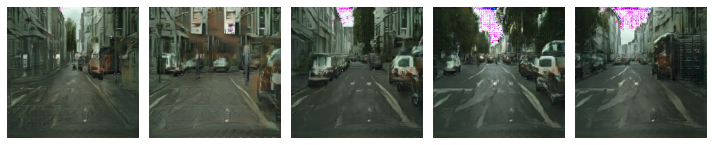

Time for training : 2849 sec


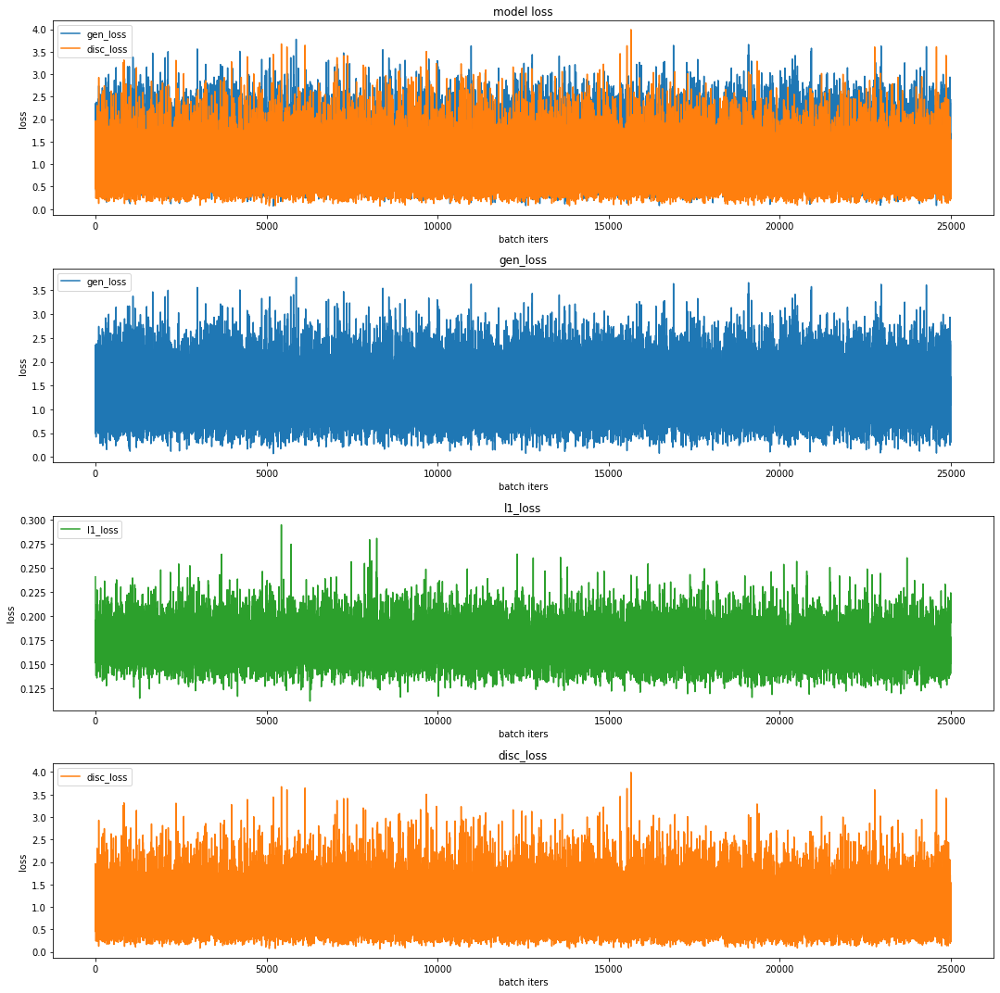

CPU times: user 49min 3s, sys: 4min 36s, total: 53min 39s
Wall time: 47min 35s


In [32]:
%%time
train(train_images, EPOCHS, save_every, 2)

In [33]:
# Fake Images to GIF
make_a_gif(2, True)

In [34]:
# History Graphs to GIF
make_a_gif(2, False)

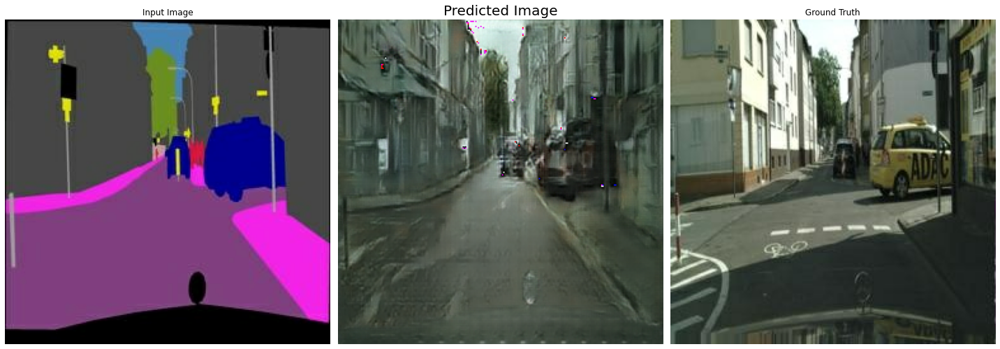

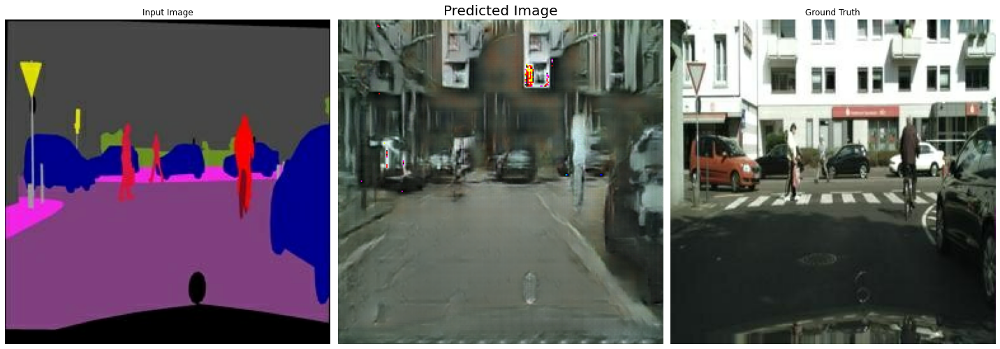

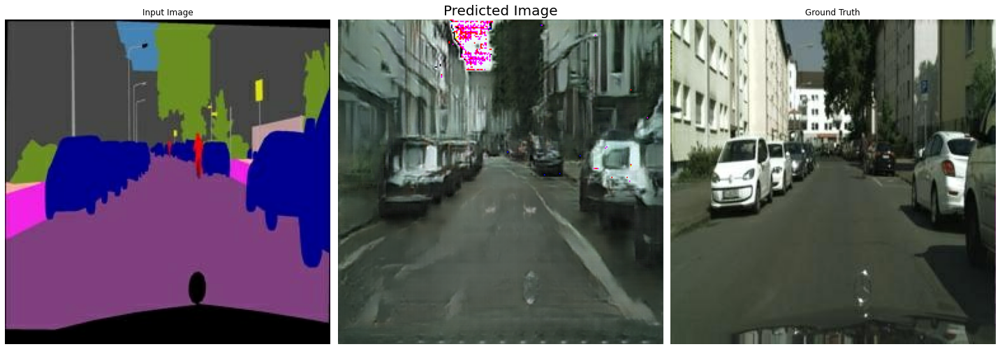

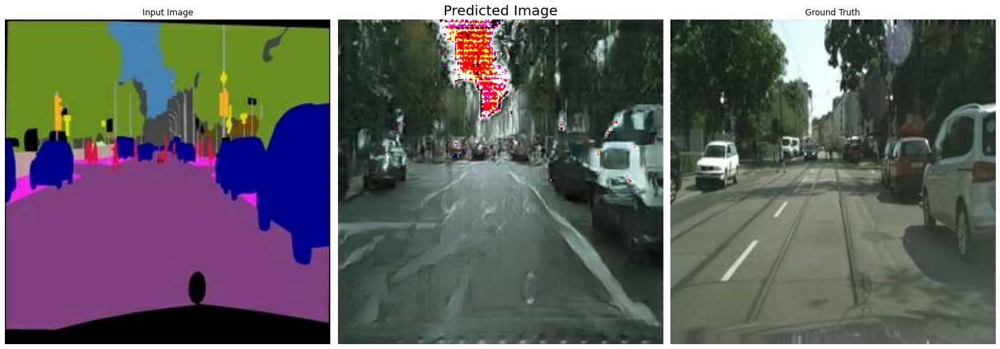

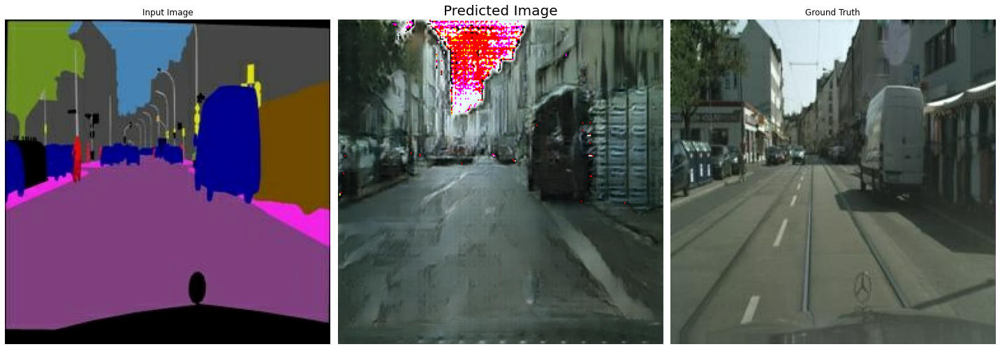

In [35]:
draw_training_checkpoints_image(2)

---

- 결과 정리
    - epochs=100

||train images|test images|
|:---:|:---:|:---:|
|Image PNG|![](cityscapes/generated_samples/sample_1/sample_epoch_0100_iter_249.png)|![](cityscapes/generated_samples/sample_2/sample_epoch_0100_iter_249.png)|
|Image GIF|![](cityscapes/gif/Pix2Pix_1.gif)|![](cityscapes/gif/Pix2Pix_2.gif)|
|History PNG|![](cityscapes/training_history/training_history_1/training_history_0100.png)|![](cityscapes/training_history/training_history_2/training_history_0100.png)|
|History GIF|![](cityscapes/gif/Pix2Pix_history_1.gif)|![](cityscapes/gif/Pix2Pix_history_2.gif)|

- 결론

train_images 와 test_images 이미지 데이터를 Pix2Pix 로 진행해 본 결과, 아직 real_image 에 비하면 모자라다는 것을 알 수 있다. 그러다 보니 Generator_loss 와 Discriminator_loss 가 우상향, 우하향하는 모습을 보지 못했다. epoch 을 기존에 진행한 값 100 보다 더 높여서 300 이상으로 진행하면 좀 더 깔끔하게 나올 것이라 생각한다.

---

# 회고

### - 이번 프로젝트에서 **어려웠던 점**.
[E-10] gif 생성 코드를 [E-17] 에서도 쓸 수 있게끔 고치는 것이 힘들었다.

### - 프로젝트를 진행하면서 **알아낸 점** 혹은 **아직 모호한 점**.
- GAN
    - 조건 없는 생성모델(Unconditional Generative Model)
    - 내가 원하는 종류의 이미지를 바로 생성해 내지 못한다.
    - ![GAN](https://d3s0tskafalll9.cloudfront.net/media/images/gan_img.max-800x600.png)
- cGAN(Conditional Generative Adversarial Nets)
    - 조건 있는 생성모델(Conditional Generative Model)
    - 내가 원하는 종류의 이미지를 생성할 수 있도록 고안된 방법
    - cGAN의 입력은 2개(노이즈 및 레이블 정보)
    - ![cGAN](https://d3s0tskafalll9.cloudfront.net/media/images/cgan_img.max-800x600.png)
- Pix2Pix
    - 이미지 변환이 목적
    - convolution 레이어 활용
    - U-Net generator
        - Encoder와 Decoder 사이를 **skip connection** 으로 연결한 구조
        - 일반적인 Encoder-Decoder 구조와 U-Net 구조의 결과 비교<br>![Encoder-Decoder vs U-Net](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_result_g2.max-800x600.png)
    - discriminator
        - 전체 영역을 다 보는 것이 아닌 일부 영역(파란색 점선)에 대해서만 진짜/가짜를 판별하는 하나의 확률 값을 도출


### - 루브릭 평가 지표를 맞추기 위해 **시도한 것들**.

>#### **루브릭**
>|번호|평가문항|상세기준|
>|:---:|---|---|
>|1|pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다.|데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.|
>|2|pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.|U-Net generator, discriminator 모델 구현이 완료되어 train_step이 안정적으로 진행됨을 확인하였다.|
>|3|학습 과정 및 테스트에 대한 시각화 결과를 제출하였다.|10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.|

텐서플로우 random 상하 반전, 좌우 반전, 각도 변환과 같은 여러 augmentation 적용을 통해 데이터의 다양성을 높였다. 

U-Net generator 와 discriminator 를 구현하여 학습을 진행했다. train_step 이 지날수록 real_image 에 가깝게 이미지를 생성하는 것을 볼 수 있었다.

epochs=100 으로 진행했고 시각화를 위해 [E-10] 에서 썼던 gif 생성 코드를 고쳐서 사용했다. 시각화한 이미지를 저장하고 gif 로 만들어서 마크다운에 붙였다. epoch 을 늘리면 좀 더 선명하고 real_image 와 유사한 결과를 얻으리라 생각한다.


### - 만약에 루브릭 평가 관련 지표를 **달성 하지 못했을 때, 이유에 관한 추정**.
없음

### - **자기 다짐**
드디어 EXPLORATION 에서 해방됐다.. 물론 GOING DEEPER 가 날 기다리고 있는 건 함정~